In [1]:
%load_ext autoreload
%autoreload 2

import sys
import os
import time

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

sys.path.append(os.environ['REPO_DIR'] + '/utilities')
from utilities2015 import *
from registration_utilities import *
from data_manager import *
from metadata import *

/usr/local/lib/python2.7/dist-packages/matplotlib/__init__.py:1405: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


Setting environment for AWS compute node


No vtk


In [2]:
stack_fixed = 'MD589'
stack_moving = 'MD594'

In [3]:
volume_fixed, structure_to_label_fixed, label_to_structure_fixed = \
DataManager.load_original_volume_all_known_structures(stack=stack_fixed, volume_type='annotationAsScore', sided=True)

vol_fixed_xmin, vol_fixed_xmax, vol_fixed_ymin, vol_fixed_ymax, vol_fixed_zmin, vol_fixed_zmax = \
DataManager.load_original_volume_bbox(stack=stack_fixed, volume_type='annotation')

File does not exist: /shared/CSHL_volumes/MD589/MD589_down32_annotationVolume/MD589_down32_annotationVolume_nameToLabel.txt
Prior structure/index map not found. Generating a new one.


rm -rf "/shared/CSHL_volumes/MD589/MD589_down32_annotationAsScoreVolume/score_volumes/MD589_down32_annotationAsScoreVolume_outerContour.bp" && mkdir -p "/shared/CSHL_volumes/MD589/MD589_down32_annotationAsScoreVolume/score_volumes"
aws s3 cp "s3://mousebrainatlas-data/CSHL_volumes/MD589/MD589_down32_annotationAsScoreVolume/score_volumes/MD589_down32_annotationAsScoreVolume_outerContour.bp" "/shared/CSHL_volumes/MD589/MD589_down32_annotationAsScoreVolume/score_volumes/MD589_down32_annotationAsScoreVolume_outerContour.bp"


File does not exist: /shared/CSHL_volumes/MD589/MD589_down32_annotationAsScoreVolume/score_volumes/MD589_down32_annotationAsScoreVolume_outerContour.bp
Score volume for outerContour does not exist: [Errno 2] No such file or directory: '/shared/CSHL_volumes/MD589/MD589_down32_annotationAsScoreVolume/score_volumes/MD589_down32_annotationAsScoreVolume_outerContour.bp'


rm -rf "/shared/CSHL_volumes/MD589/MD589_down32_annotationAsScoreVolume/score_volumes/MD589_down32_annotationAsScoreVolume_sp5.bp" && mkdir -p "/shared/CSHL_volumes/MD589/MD589_down32_annotationAsScoreVolume/score_volumes"
aws s3 cp "s3://mousebrainatlas-data/CSHL_volumes/MD589/MD589_down32_annotationAsScoreVolume/score_volumes/MD589_down32_annotationAsScoreVolume_sp5.bp" "/shared/CSHL_volumes/MD589/MD589_down32_annotationAsScoreVolume/score_volumes/MD589_down32_annotationAsScoreVolume_sp5.bp"


File does not exist: /shared/CSHL_volumes/MD589/MD589_down32_annotationAsScoreVolume/score_volumes/MD589_down32_annotationAsScoreVolume_sp5.bp
Score volume for sp5 does not exist: [Errno 2] No such file or directory: '/shared/CSHL_volumes/MD589/MD589_down32_annotationAsScoreVolume/score_volumes/MD589_down32_annotationAsScoreVolume_sp5.bp'
Volume shape: (348, 421, 376)


In [4]:
volume_moving, structure_to_label_moving, label_to_structure_moving = \
DataManager.load_original_volume_all_known_structures(stack=stack_moving, volume_type='annotationAsScore', sided=True)

vol_moving_xmin, vol_moving_xmax, vol_moving_ymin, vol_moving_ymax, vol_moving_zmin, vol_moving_zmax = \
DataManager.load_original_volume_bbox(stack=stack_fixed, volume_type='annotation')

File does not exist: /shared/CSHL_volumes/MD594/MD594_down32_annotationVolume/MD594_down32_annotationVolume_nameToLabel.txt
Prior structure/index map not found. Generating a new one.


rm -rf "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_outerContour.bp" && mkdir -p "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume/score_volumes"
aws s3 cp "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_outerContour.bp" "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_outerContour.bp"


File does not exist: /shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_outerContour.bp
Score volume for outerContour does not exist: [Errno 2] No such file or directory: '/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_outerContour.bp'


rm -rf "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_sp5.bp" && mkdir -p "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume/score_volumes"
aws s3 cp "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_sp5.bp" "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_sp5.bp"


File does not exist: /shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_sp5.bp
Score volume for sp5 does not exist: [Errno 2] No such file or directory: '/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_sp5.bp'
Volume shape: (327, 518, 366)


In [5]:
# if surround_weight == 'inverse':
#     if 'volume_moving_structure_sizes' not in locals():
#         # not in local namespace, not been computed
#         volume_moving_structure_sizes = {l: np.count_nonzero(vol > 0) for l, vol in volume_moving.iteritems()}
        
#     label_weights_m = {label_m: -volume_moving_structure_sizes[structure_to_label_moving[convert_to_nonsurround_name(name_m)]]
#                        /float(volume_moving_structure_sizes[label_m])
#                        if is_surround_label(name_m) else 1. \
#                        for label_m, name_m in label_to_structure_moving.iteritems()}
# elif isinstance(surround_weight, int) or isinstance(surround_weight, float):
#     label_weights_m = {label_m: surround_weight if is_surround_label(name_m) else 1. \
#                    for label_m, name_m in label_to_structure_moving.iteritems()}
# else:
#     sys.stderr.write("surround_weight %s is not recognized. Using the default.\n" % surround_weight)

In [6]:
# label_weights_m = {}
# for label_m, name_m in label_to_structure_moving.iteritems():
#     if 'surround' in name_m:
#         label_weights_m[label_m] = 0
#     else:
#         label_weights_m[label_m] = 1
# #         label_weights_m[label_m] = np.minimum(1e5 / volume_moving_structure_sizes[label_m], 1.)

In [5]:
registration_settings = read_csv(REGISTRATION_SETTINGS_CSV, header=0, index_col=0)
registration_settings

,upstream_warp_id,transform_type,terminate_thresh,grad_computation_sample_number,grid_search_sample_number,std_tx_um,std_ty_um,std_tz_um,std_theta_xy_degree,surround_weight,regularization_weight,comment
warp_id,,,,,,,,,,,,
1,None,affine,0.000010,100000.0,1000.0,2000,2000,2000,30,0,NaN,NaN
2,1,rigid,0.000010,100000.0,10000.0,100,100,100,30,0,NaN,NaN
4,1,rigid,0.000001,100000.0,10000.0,100,100,100,10,0,0.000001,NaN
5,1,rigid,0.000001,100000.0,10000.0,100,100,100,30,inverse,0.000000,NaN
6,1,affine,0.000010,100000.0,10000.0,100,100,100,30,-0.5,0.000000,NaN
7,None,rigid,0.000001,100000.0,1000.0,50,50,50,10,0,NaN,NaN
8,None,rigid,0.000001,100000.0,10000.0,200,200,200,30,inverse,0.000000,align mid-sagittal planes
9,8,rigid,0.000001,100000.0,10000.0,200,200,200,30,NaN,NaN,global registration given mid-sagittal planes ...
18,8,affine,0.000001,100000.0,10000.0,200,200,200,30,NaN,NaN,global registration given mid-sagittal planes ...


In [7]:
warp_setting = 9

# Align mid-sagittal planes

In [8]:
def get_structure_centroids(vols):
    structure_centroids = {}
    for label, v in vols.iteritems():
        ym, xm, zm = np.mean(np.nonzero(v), axis=1)
        structure_centroids[label] = (xm, ym, zm)
    return structure_centroids

In [9]:
structure_centroids_fixed = get_structure_centroids(volume_fixed)
structure_centroids_moving = get_structure_centroids(volume_moving)

In [10]:
structure_centroids_fixed = {label_to_structure_fixed[i]: c for i, c in structure_centroids_fixed.iteritems()}
structure_centroids_moving = {label_to_structure_moving[i]: c for i, c in structure_centroids_moving.iteritems()}

In [11]:
def collect_midpoints(structure_centroids):
    """
    structure_centroids: dict of {structure name: (x,y,z)}
    """
    midpoints = {}
    for s in all_known_structures:
        if s in singular_structures:
            if s not in structure_centroids:
                continue
            c = np.array(structure_centroids[s])
        else:
            sl = convert_to_left_name(s)
            sr = convert_to_right_name(s)
            if sl not in structure_centroids or sr not in structure_centroids:
                continue
            c = (np.array(structure_centroids[sl]) + np.array(structure_centroids[sr]))/2
        midpoints[s] = c
    return midpoints

In [12]:
midplane_points_fixed = collect_midpoints(structure_centroids_fixed)
midplane_vector_fixed, midplane_centroid_fixed = fit_plane(midplane_points_fixed.values())

In [13]:
midplane_points_moving = collect_midpoints(structure_centroids_moving)
midplane_vector_moving, midplane_centroid_moving = fit_plane(midplane_points_moving.values())

In [14]:
ydim_f, xdim_f, zdim_f = volume_fixed.values()[0].shape

In [15]:
R = R_align_two_vectors(midplane_vector_moving, midplane_vector_fixed)

In [16]:
# # Method 1

# t = midplane_centroid_fixed - np.dot(R, midplane_centroid_moving)
# T_align_midplane = np.c_[R, t].flatten()

# print T_align_midplane

In [17]:
# volume_moving_midplane_aligned = {label: transform_volume(vol, T_align_midplane, 
#                                                          centroid_m=(0,0,0), centroid_f=(0,0,0), 
#                                                          xdim_f=xdim_f, ydim_f=ydim_f, zdim_f=zdim_f) 
#                                  for label, vol in volume_moving.iteritems()}

In [18]:
# Method 2

T_align_midplane = np.zeros((3,4))
T_align_midplane[:3, :3] = R
T_align_midplane = T_align_midplane.flatten()

print T_align_midplane

[ 0.9972701  -0.0029867   0.07377961  0.          0.00706677  0.99845573
 -0.05510183  0.         -0.0735011   0.05547279  0.99575115  0.        ]


In [19]:
volume_moving_midplane_aligned = {label: transform_volume(vol, T_align_midplane, 
                                                         centroid_m=midplane_centroid_moving, centroid_f=midplane_centroid_fixed, 
                                                         xdim_f=xdim_f, ydim_f=ydim_f, zdim_f=zdim_f) 
                                 for label, vol in volume_moving.iteritems()}

In [18]:
# Save mid-sagittal plane aligned volumes.

# for label, vol in volume_moving_midplane_aligned.iteritems():
    
#     volume_moving_midplane_align_fp = \
#     DataManager.get_transformed_volume_filepath(stack_m=stack_moving, stack_f=stack_fixed, 
#                                                 structure=label_to_structure_moving[label], 
#                                                 vol_type_m='annotationAsScore', vol_type_f='annotationAsScore', 
#                                                 warp_setting=warp_setting)
    
#     create_parent_dir_if_not_exists(volume_moving_midplane_align_fp)
#     bp.pack_ndarray_file(vol, volume_moving_midplane_align_fp)
#     upload_to_s3(volume_moving_midplane_align_fp)

aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_10N_L.bp" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_10N_L.bp"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_10N_R.bp" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_10N_R.bp"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_an

aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_DC_R.bp" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_DC_R.bp"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_IC.bp" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_IC.bp"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotation

aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_Sp5C_R.bp" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_Sp5C_R.bp"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_Sp5I_L.bp" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_Sp5I_L.bp"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down3

In [20]:
# Save mid-sagittal plane aligned integer-valued volume.

volume_m_int = DataManager.load_annotation_volume(stack=stack_moving, downscale=32)
print volume_m_int.shape

volume_m_int_midplane_aligned = transform_volume(vol=volume_m_int, 
                                        global_params=T_align_midplane, 
                                        centroid_m=midplane_centroid_moving, centroid_f=midplane_centroid_fixed, 
                                        xdim_f=xdim_f, ydim_f=ydim_f, zdim_f=zdim_f)

output_fp = DataManager.get_transformed_volume_filepath(stack_m=stack_moving, vol_type_m='annotation',
                                                        stack_f=stack_fixed, vol_type_f='annotation',
                                                        warp_setting=8)
create_parent_dir_if_not_exists(output_fp)
bp.pack_ndarray_file(volume_m_int_midplane_aligned, output_fp)
upload_to_s3(output_fp)

(327, 518, 366)


# Affine registration, under the constaint that mid-sagittal plane is aligned.

In [49]:
# warp_setting = 9

In [22]:
# registration_settings = read_csv(REGISTRATION_SETTINGS_CSV, header=0, index_col=0)
# registration_settings

In [23]:
warp_properties = registration_settings.loc[warp_setting]
print warp_properties

upstream_warp_setting = warp_properties['upstream_warp_id']
if upstream_warp_setting == 'None':
    upstream_warp_setting = None
else:
    upstream_warp_setting = int(upstream_warp_setting)
    
transform_type = warp_properties['transform_type']
terminate_thresh = warp_properties['terminate_thresh']
grad_computation_sample_number = warp_properties['grad_computation_sample_number']
grid_search_sample_number = warp_properties['grid_search_sample_number']
std_tx_um = warp_properties['std_tx_um']
std_ty_um = warp_properties['std_ty_um']
std_tz_um = warp_properties['std_tz_um']
std_tx = std_tx_um/(XY_PIXEL_DISTANCE_LOSSLESS*32)
std_ty = std_ty_um/(XY_PIXEL_DISTANCE_LOSSLESS*32)
std_tz = std_tz_um/(XY_PIXEL_DISTANCE_LOSSLESS*32)
std_theta_xy = np.deg2rad(warp_properties['std_theta_xy_degree'])
print std_tx, std_ty, std_tz, std_theta_xy

# try:
#     surround_weight = float(warp_properties['surround_weight'])
#     include_surround = surround_weight != 0 and not np.isnan(surround_weight)
# except:
#     surround_weight = str(warp_properties['surround_weight'])
#     # Setting surround_weight as inverse is very important. Using -1 often gives false peaks.
#     include_surround = True

upstream_warp_id                                                                  8
transform_type                                                                rigid
terminate_thresh                                                              1e-06
grad_computation_sample_number                                               100000
grid_search_sample_number                                                     10000
std_tx_um                                                                       200
std_ty_um                                                                       200
std_tz_um                                                                       200
std_theta_xy_degree                                                              30
surround_weight                                                                 NaN
regularization_weight                                                           NaN
comment                           global registration given mid-sagittal pla

In [24]:
structure_subset = ['7N_L', '7N_R', '12N', '5N_L','5N_R','Pn_L', 'Pn_R', 'SNR_L', 'SNR_R', 
                    'VLL_L', 'VLL_R', '7n_L', '7n_R', 'Tz_L', 'Tz_R', 
                    'VCA_L', 'VCA_R', 'VCP_L', 'VCP_R',
                   'Sp5C_L', 'Sp5C_R']

label_mapping_m2f = {label_m: structure_to_label_fixed[name_m] 
                     for label_m, name_m in label_to_structure_moving.iteritems()
                     if name_m in structure_subset}

In [26]:
aligner = Aligner4(volume_fixed, volume_moving_midplane_aligned, labelIndexMap_m2f=label_mapping_m2f)

Label weights not set, default to 1 for all structures.
Regularization weights not set, default to 0.


In [27]:
aligner.set_centroid(centroid_m='volume_centroid', centroid_f='volume_centroid')
# aligner.set_centroid(centroid_m='structure_centroid', centroid_f='centroid_m', indices_m=[name_to_label_moving['SNR_R']])

m: [ 210.5  174.   188. ] f: [ 210.5  174.   188. ]


In [28]:
# Grid search is not necessary. 

# grid_search_T, grid_search_score = aligner.do_grid_search(grid_search_iteration_number=1000, 
#                        grid_search_sample_number=5,
#                       std_tx=std_tx, std_ty=std_ty, std_tz=0, std_theta_xy=0,
#                        grid_search_eta=3.)

In [29]:
gradient_filepath_map_f = {ind_f: DataManager.get_volume_gradient_filepath_template(\
                            stack=stack_fixed, structure=label_to_structure_fixed[ind_f],
                            downscale=32, volume_type='annotationAsScore')
                           for ind_m, ind_f in label_mapping_m2f.iteritems()}

In [30]:
aligner.load_gradient(gradient_filepath_map_f=gradient_filepath_map_f)

set([13, 3, 36, 37, 38, 39, 8, 9, 14, 44, 45, 46, 47, 48, 49, 50, 51, 12, 15, 28, 29])


load gradient 13: 1.092761 seconds
load gradient 3: 1.091091 seconds
load gradient 36: 1.096296 seconds
load gradient 37: 1.096407 seconds
load gradient 38: 1.097756 seconds
load gradient 39: 1.099699 seconds
load gradient 8: 1.095661 seconds
load gradient 9: 1.094608 seconds
load gradient 14: 1.096417 seconds
load gradient 44: 1.096799 seconds
load gradient 45: 1.096733 seconds
load gradient 46: 1.098562 seconds
load gradient 47: 1.096809 seconds
load gradient 48: 1.096181 seconds
load gradient 49: 1.095397 seconds
load gradient 50: 1.131243 seconds
load gradient 51: 1.097689 seconds
load gradient 12: 1.096483 seconds
load gradient 15: 1.095174 seconds
load gradient 28: 1.098862 seconds
load gradient 29: 1.097656 seconds
overall: 23.060641 seconds


In [31]:
# aligner.set_label_weights(label_weights=label_weights_m)

In [32]:
T, scores = aligner.optimize(tf_type=transform_type, 
                                     max_iter_num=1000,
                                     history_len=50, 
                                     terminate_thresh=1e-4,
                                     grad_computation_sample_number=grad_computation_sample_number,
                             full_lr=np.array([10,10,0,0,0,.1]))
#                                     init_T=grid_search_T)
traj = aligner.Ts


iteration 0
3: 45221 samples out of 45221
36: 100000 samples out of 161701
37: 100000 samples out of 164899
38: 100000 samples out of 177033
39: 100000 samples out of 108902
8: 30284 samples out of 30284
9: 25098 samples out of 25098
29: 65417 samples out of 65417
46: 51663 samples out of 51663
44: 12841 samples out of 12841
45: 14178 samples out of 14178
12: 59499 samples out of 59499
47: 55682 samples out of 55682
48: 22152 samples out of 22152
49: 22683 samples out of 22683
50: 34236 samples out of 34236
51: 36989 samples out of 36989
14: 23455 samples out of 23455
15: 22427 samples out of 22427
28: 78616 samples out of 78616
13: 61666 samples out of 61666
step: 0.43 seconds
current score: 0.256803
new_T: [-9.79025729 -4.15256231  0.        ]
det: 1.00

iteration 1
3: 45221 samples out of 45221
36: 100000 samples out of 158893
37: 100000 samples out of 148599
38: 100000 samples out of 177033
39: 100000 samples out of 108902
8: 30284 samples out of 30284
9: 25098 samples out of 2509

step: 0.42 seconds
current score: 0.718683
new_T: [  4.27662796  14.56002151   0.        ]
det: 1.00

iteration 11
3: 45221 samples out of 45221
36: 100000 samples out of 160462
37: 100000 samples out of 155424
38: 100000 samples out of 176998
39: 100000 samples out of 108902
8: 30284 samples out of 30284
9: 25098 samples out of 25098
29: 65417 samples out of 65417
46: 51663 samples out of 51663
44: 12841 samples out of 12841
45: 14178 samples out of 14178
12: 59499 samples out of 59499
47: 55682 samples out of 55682
48: 22152 samples out of 22152
49: 22683 samples out of 22683
50: 34236 samples out of 34236
51: 36989 samples out of 36989
14: 23455 samples out of 23455
15: 22427 samples out of 22427
28: 78616 samples out of 78616
13: 61666 samples out of 61666
step: 0.42 seconds
current score: 0.745412
new_T: [  6.94888875  12.36713035   0.        ]
det: 1.00

iteration 12
3: 45221 samples out of 45221
36: 100000 samples out of 161337
37: 100000 samples out of 159612
38: 100000 samples

step: 0.42 seconds
current score: 0.765269
new_T: [  7.77700122  14.2008228    0.        ]
det: 1.00

iteration 22
3: 45221 samples out of 45221
36: 100000 samples out of 161161
37: 100000 samples out of 159042
38: 100000 samples out of 176978
39: 100000 samples out of 108902
8: 30284 samples out of 30284
9: 25098 samples out of 25098
29: 65417 samples out of 65417
46: 51663 samples out of 51663
44: 12841 samples out of 12841
45: 14178 samples out of 14178
12: 59499 samples out of 59499
47: 55682 samples out of 55682
48: 22152 samples out of 22152
49: 22683 samples out of 22683
50: 34236 samples out of 34236
51: 36989 samples out of 36989
14: 23455 samples out of 23455
15: 22427 samples out of 22427
28: 78616 samples out of 78616
13: 61666 samples out of 61666
step: 0.42 seconds
current score: 0.765317
new_T: [  7.8357974  14.2802961   0.       ]
det: 1.00

iteration 23
3: 45221 samples out of 45221
36: 100000 samples out of 161152
37: 100000 samples out of 159042
38: 100000 samples ou

step: 0.42 seconds
current score: 0.766564
new_T: [  8.34173073  14.65804658   0.        ]
det: 1.00

iteration 33
3: 45221 samples out of 45221
36: 100000 samples out of 161179
37: 100000 samples out of 159310
38: 100000 samples out of 176883
39: 100000 samples out of 108902
8: 30284 samples out of 30284
9: 25098 samples out of 25098
29: 65417 samples out of 65417
46: 51663 samples out of 51663
44: 12841 samples out of 12841
45: 14178 samples out of 14178
12: 59499 samples out of 59499
47: 55682 samples out of 55682
48: 22152 samples out of 22152
49: 22683 samples out of 22683
50: 34236 samples out of 34236
51: 36989 samples out of 36989
14: 23455 samples out of 23455
15: 22427 samples out of 22427
28: 78616 samples out of 78616
13: 61666 samples out of 61666
step: 0.42 seconds
current score: 0.766412
new_T: [  8.36375819  14.71967285   0.        ]
det: 1.00

iteration 34
3: 45221 samples out of 45221
36: 100000 samples out of 161179
37: 100000 samples out of 159310
38: 100000 samples

13: 61666 samples out of 61666
step: 0.43 seconds
current score: 0.766784
new_T: [  8.51815682  14.79478762   0.        ]
det: 1.00

iteration 44
3: 45221 samples out of 45221
36: 100000 samples out of 161179
37: 100000 samples out of 159388
38: 100000 samples out of 176848
39: 100000 samples out of 108902
8: 30284 samples out of 30284
9: 25098 samples out of 25098
29: 65417 samples out of 65417
46: 51663 samples out of 51663
44: 12841 samples out of 12841
45: 14178 samples out of 14178
12: 59499 samples out of 59499
47: 55682 samples out of 55682
48: 22152 samples out of 22152
49: 22683 samples out of 22683
50: 34236 samples out of 34236
51: 36989 samples out of 36989
14: 23455 samples out of 23455
15: 22427 samples out of 22427
28: 78616 samples out of 78616
13: 61666 samples out of 61666
step: 0.42 seconds
current score: 0.766763
new_T: [  8.51815556  14.81231116   0.        ]
det: 1.00

iteration 45
3: 45221 samples out of 45221
36: 100000 samples out of 161179
37: 100000 samples o

step: 0.42 seconds
current score: 0.766742
new_T: [  8.57638148  14.8606152    0.        ]
det: 1.00

iteration 55
3: 45221 samples out of 45221
36: 100000 samples out of 161192
37: 100000 samples out of 159416
38: 100000 samples out of 176826
39: 100000 samples out of 108902
8: 30284 samples out of 30284
9: 25098 samples out of 25098
29: 65417 samples out of 65417
46: 51663 samples out of 51663
44: 12841 samples out of 12841
45: 14178 samples out of 14178
12: 59499 samples out of 59499
47: 55682 samples out of 55682
48: 22152 samples out of 22152
49: 22683 samples out of 22683
50: 34236 samples out of 34236
51: 36989 samples out of 36989
14: 23455 samples out of 23455
15: 22427 samples out of 22427
28: 78616 samples out of 78616
13: 61666 samples out of 61666
step: 0.42 seconds
current score: 0.766679
new_T: [  8.60987057  14.84421977   0.        ]
det: 1.00

iteration 56
3: 45221 samples out of 45221
36: 100000 samples out of 161192
37: 100000 samples out of 159470
38: 100000 samples

step: 0.42 seconds
current score: 0.766574
new_T: [  8.60723406  14.70459907   0.        ]
det: 1.00

iteration 66
3: 45221 samples out of 45221
36: 100000 samples out of 161192
37: 100000 samples out of 159470
38: 100000 samples out of 176848
39: 100000 samples out of 108902
8: 30284 samples out of 30284
9: 25098 samples out of 25098
29: 65417 samples out of 65417
46: 51663 samples out of 51663
44: 12841 samples out of 12841
45: 14178 samples out of 14178
12: 59499 samples out of 59499
47: 55682 samples out of 55682
48: 22152 samples out of 22152
49: 22683 samples out of 22683
50: 34236 samples out of 34236
51: 36989 samples out of 36989
14: 23455 samples out of 23455
15: 22427 samples out of 22427
28: 78616 samples out of 78616
13: 61666 samples out of 61666
step: 0.42 seconds
current score: 0.766936
new_T: [  8.50538461  14.87346912   0.        ]
det: 1.00

iteration 67
3: 45221 samples out of 45221
36: 100000 samples out of 161163
37: 100000 samples out of 159298
38: 100000 samples

step: 0.42 seconds
current score: 0.766790
new_T: [  8.59811174  14.82455628   0.        ]
det: 1.00

iteration 77
3: 45221 samples out of 45221
36: 100000 samples out of 161192
37: 100000 samples out of 159470
38: 100000 samples out of 176826
39: 100000 samples out of 108902
8: 30284 samples out of 30284
9: 25098 samples out of 25098
29: 65417 samples out of 65417
46: 51663 samples out of 51663
44: 12841 samples out of 12841
45: 14178 samples out of 14178
12: 59499 samples out of 59499
47: 55682 samples out of 55682
48: 22152 samples out of 22152
49: 22683 samples out of 22683
50: 34236 samples out of 34236
51: 36989 samples out of 36989
14: 23455 samples out of 23455
15: 22427 samples out of 22427
28: 78616 samples out of 78616
13: 61666 samples out of 61666
step: 0.42 seconds
current score: 0.766788
new_T: [  8.58623231  14.85675744   0.        ]
det: 1.00

iteration 78
3: 45221 samples out of 45221
36: 100000 samples out of 161179
37: 100000 samples out of 159388
38: 100000 samples

step: 0.42 seconds
current score: 0.766745
new_T: [  8.60166887  14.88131513   0.        ]
det: 1.00

iteration 88
3: 45221 samples out of 45221
36: 100000 samples out of 161179
37: 100000 samples out of 159397
38: 100000 samples out of 176822
39: 100000 samples out of 108902
8: 30284 samples out of 30284
9: 25098 samples out of 25098
29: 65417 samples out of 65417
46: 51663 samples out of 51663
44: 12841 samples out of 12841
45: 14178 samples out of 14178
12: 59499 samples out of 59499
47: 55682 samples out of 55682
48: 22152 samples out of 22152
49: 22683 samples out of 22683
50: 34236 samples out of 34236
51: 36989 samples out of 36989
14: 23455 samples out of 23455
15: 22427 samples out of 22427
28: 78616 samples out of 78616
13: 61666 samples out of 61666
step: 0.42 seconds
current score: 0.766780
new_T: [  8.62155922  14.88583265   0.        ]
det: 1.00

iteration 89
3: 45221 samples out of 45221
36: 100000 samples out of 161192
37: 100000 samples out of 159470
38: 100000 samples

step: 0.42 seconds
current score: 0.766815
new_T: [  8.56527607  14.87786835   0.        ]
det: 1.00

iteration 99
3: 45221 samples out of 45221
36: 100000 samples out of 161179
37: 100000 samples out of 159388
38: 100000 samples out of 176822
39: 100000 samples out of 108902
8: 30284 samples out of 30284
9: 25098 samples out of 25098
29: 65417 samples out of 65417
46: 51663 samples out of 51663
44: 12841 samples out of 12841
45: 14178 samples out of 14178
12: 59499 samples out of 59499
47: 55682 samples out of 55682
48: 22152 samples out of 22152
49: 22683 samples out of 22683
50: 34236 samples out of 34236
51: 36989 samples out of 36989
14: 23455 samples out of 23455
15: 22427 samples out of 22427
28: 78616 samples out of 78616
13: 61666 samples out of 61666
step: 0.42 seconds
current score: 0.766718
new_T: [  8.59303483  14.88662043   0.        ]
det: 1.00

iteration 100
3: 45221 samples out of 45221
36: 100000 samples out of 161179
37: 100000 samples out of 159388
38: 100000 sample

step: 0.42 seconds
current score: 0.766724
new_T: [  8.60586782  14.83322621   0.        ]
det: 1.00

iteration 110
3: 45221 samples out of 45221
36: 100000 samples out of 161192
37: 100000 samples out of 159470
38: 100000 samples out of 176826
39: 100000 samples out of 108902
8: 30284 samples out of 30284
9: 25098 samples out of 25098
29: 65417 samples out of 65417
46: 51663 samples out of 51663
44: 12841 samples out of 12841
45: 14178 samples out of 14178
12: 59499 samples out of 59499
47: 55682 samples out of 55682
48: 22152 samples out of 22152
49: 22683 samples out of 22683
50: 34236 samples out of 34236
51: 36989 samples out of 36989
14: 23455 samples out of 23455
15: 22427 samples out of 22427
28: 78616 samples out of 78616
13: 61666 samples out of 61666
step: 0.42 seconds
current score: 0.766790
new_T: [  8.58912632  14.84734248   0.        ]
det: 1.00

iteration 111
3: 45221 samples out of 45221
36: 100000 samples out of 161179
37: 100000 samples out of 159388
38: 100000 sampl

step: 0.42 seconds
current score: 0.766653
new_T: [  8.62473756  14.93513371   0.        ]
det: 1.00

iteration 121
3: 45221 samples out of 45221
36: 100000 samples out of 161192
37: 100000 samples out of 159470
38: 100000 samples out of 176822
39: 100000 samples out of 108902
8: 30284 samples out of 30284
9: 25098 samples out of 25098
29: 65417 samples out of 65417
46: 51663 samples out of 51663
44: 12841 samples out of 12841
45: 14178 samples out of 14178
12: 59499 samples out of 59499
47: 55682 samples out of 55682
48: 22152 samples out of 22152
49: 22683 samples out of 22683
50: 34236 samples out of 34236
51: 36989 samples out of 36989
14: 23455 samples out of 23455
15: 22427 samples out of 22427
28: 78616 samples out of 78616
13: 61666 samples out of 61666
step: 0.42 seconds
current score: 0.766624
new_T: [  8.62730386  14.82164084   0.        ]
det: 1.00

iteration 122
3: 45221 samples out of 45221
36: 100000 samples out of 161192
37: 100000 samples out of 159470
38: 100000 sampl

[[  0.96461399  -0.26366616   0.           8.50538461]
 [  0.26366616   0.96461399   0.          14.87346912]
 [  0.           0.           1.           0.        ]]
0.766954064835 0.766879088711


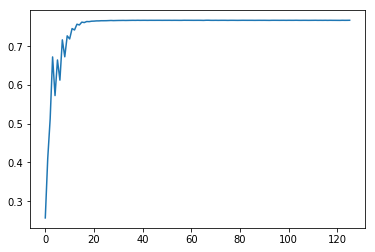

In [33]:
print T.reshape((3,4))
plt.plot(scores);
print max(scores), scores[-1]

# Export parameters and score plots

In [34]:
params_fp = \
DataManager.get_alignment_result_filepath(stack_m=stack_moving, stack_f=stack_fixed,
                                          vol_type_f='annotationAsScore', vol_type_m='annotationAsScore',
                                          warp_setting=warp_setting, what='parameters')
DataManager.save_alignment_parameters(params_fp, T, 
                                      aligner.centroid_m, aligner.centroid_f,
                                      aligner.xdim_m, aligner.ydim_m, aligner.zdim_m, 
                                      aligner.xdim_f, aligner.ydim_f, aligner.zdim_f)
upload_to_s3(params_fp)

##################################

history_fp = DataManager.get_alignment_result_filepath(stack_m=stack_moving, stack_f=stack_fixed,
                                                       vol_type_f='annotationAsScore', vol_type_m='annotationAsScore',
                                                       warp_setting=warp_setting, what='scoreHistory')
bp.pack_ndarray_file(np.array(scores), history_fp)
upload_to_s3(history_fp)

##################################

score_plot_fp = DataManager.get_alignment_result_filepath(stack_m=stack_moving, stack_f=stack_fixed, 
                                                          vol_type_f='annotationAsScore', vol_type_m='annotationAsScore',
                                                          warp_setting=warp_setting, what='scoreEvolution')
fig = plt.figure();
plt.plot(scores);
plt.savefig(score_plot_fp, bbox_inches='tight')
plt.close(fig)

upload_to_s3(score_plot_fp)

##################################

trajectory_fp = DataManager.get_alignment_result_filepath(stack_m=stack_moving, stack_f=stack_fixed,
                                                          vol_type_f='annotationAsScore', vol_type_m='annotationAsScore',
                                                          warp_setting=warp_setting, what='trajectory')
bp.pack_ndarray_file(np.array(traj), trajectory_fp)
upload_to_s3(trajectory_fp)

aws s3 cp "/shared/CSHL_registration_parameters/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_parameters.txt" "s3://mousebrainatlas-data/CSHL_registration_parameters/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_parameters.txt"
aws s3 cp "/shared/CSHL_registration_parameters/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_scoreHistory.bp" "s3://mousebrainatlas-data/CSHL_registration_parameters/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_scoreHistory.bp"
aws s3 cp "/shared/CSHL_registration_parameters/MD594/MD594_do

## Transform midplane-aligned integer-valued volume

In [43]:
stack_fixed = 'MD589'
stack_moving = 'MD594'

In [64]:
volume_m_int_midplane_aligned = DataManager.load_transformed_volume(stack_m=stack_moving, stack_f=stack_fixed, 
                                                   warp_setting=upstream_warp_setting, 
                                                    vol_type_m='annotation', 
                                                    vol_type_f='annotation')

In [65]:
global_params, centroid_m, centroid_f, xdim_m, ydim_m, zdim_m, xdim_f, ydim_f, zdim_f = \
DataManager.load_alignment_parameters(stack_f=stack_fixed, stack_m=stack_moving, 
                                      vol_type_f='annotationAsScore', vol_type_m='annotationAsScore',
                                      warp_setting=warp_setting)

In [66]:
from registration_utilities import transform_volume

volume_m_int_aligned = transform_volume(vol=volume_m_int_midplane_aligned, 
                                           global_params=global_params, 
                                           centroid_m=centroid_m, 
                                           centroid_f=centroid_f,
                                          xdim_f=xdim_f,
                                          ydim_f=ydim_f,
                                          zdim_f=zdim_f)

In [67]:
volume_f_int = DataManager.load_annotation_volume(stack=stack_fixed, downscale=32)

In [ ]:
# Save aligned integer-valued volume.

# volume_m_int_midplane_aligned = transform_volume(vol=volume_m_int, 
#                                         global_params=T_align_midplane, 
#                                         centroid_m=midplane_centroid_moving, centroid_f=midplane_centroid_fixed, 
#                                         xdim_f=xdim_f, ydim_f=ydim_f, zdim_f=zdim_f)

output_fp = DataManager.get_transformed_volume_filepath(stack_m=stack_moving, vol_type_m='annotation',
                                                        stack_f=stack_fixed, vol_type_f='annotation',
                                                        warp_setting=8)
create_parent_dir_if_not_exists(output_fp)
bp.pack_ndarray_file(volume_m_int_midplane_aligned, output_fp)
upload_to_s3(output_fp)

# Visualize

In [ ]:
from registration_utilities import find_contour_points

In [68]:
# wrt. uncropped aligned space.

xmin_vol_f, xmax_vol_f, ymin_vol_f, ymax_vol_f, zmin_vol_f, zmax_vol_f = \
DataManager.load_original_volume_bbox(stack=stack_fixed, volume_type='annotation', downscale=32)

In [69]:
xmin_crop_f, ymin_crop_f = DataManager.load_cropbox(stack=stack_fixed)[[0,2]]

In [70]:
stack_colors = {stack_fixed: (255,0,0), stack_moving: (0,255,0)}

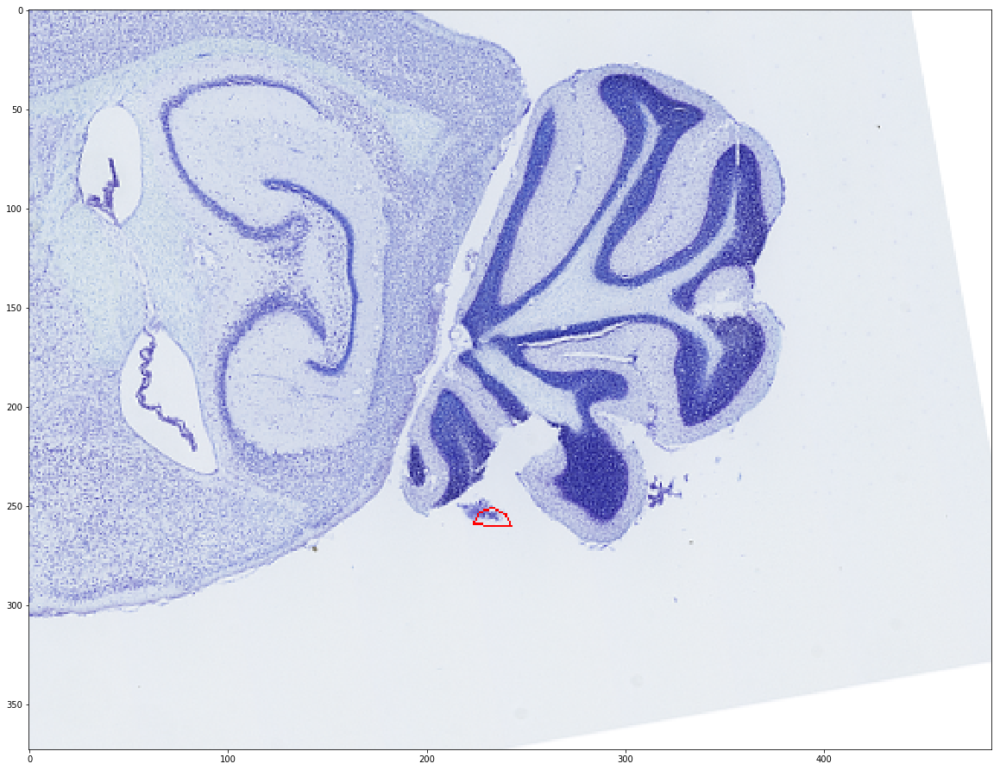

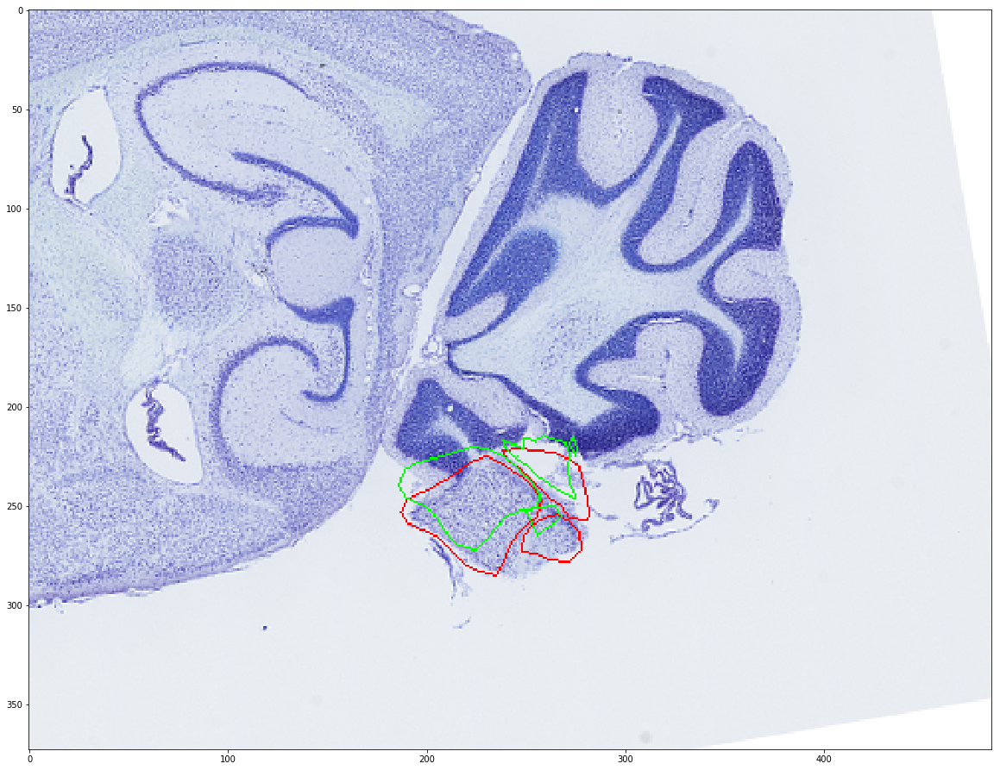

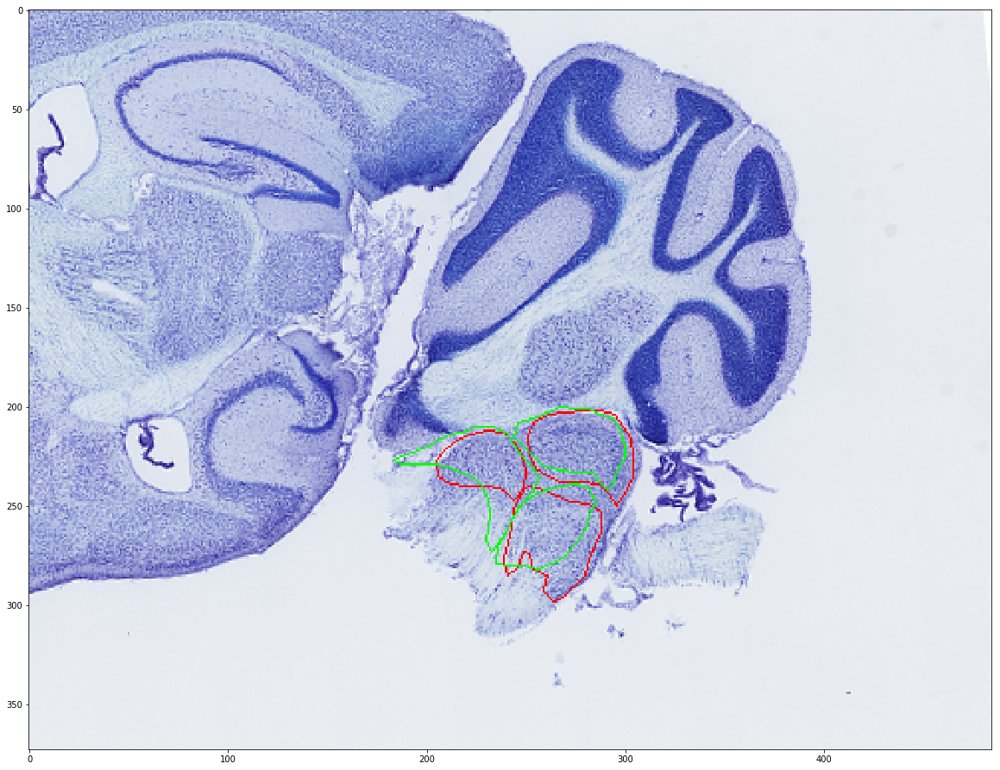

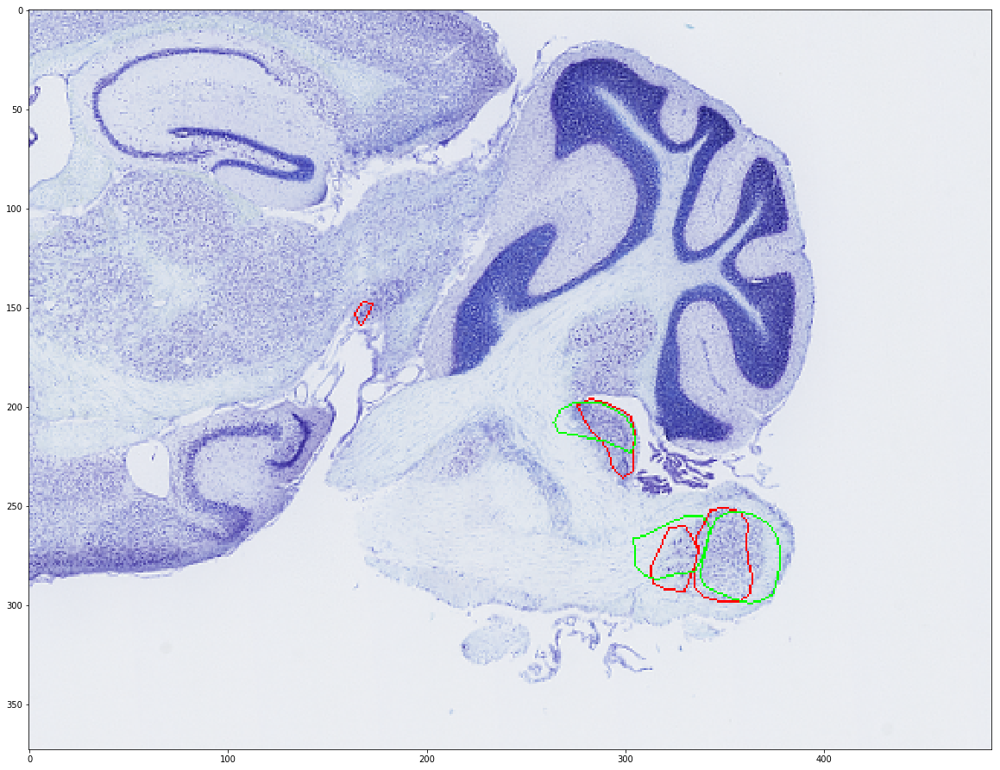

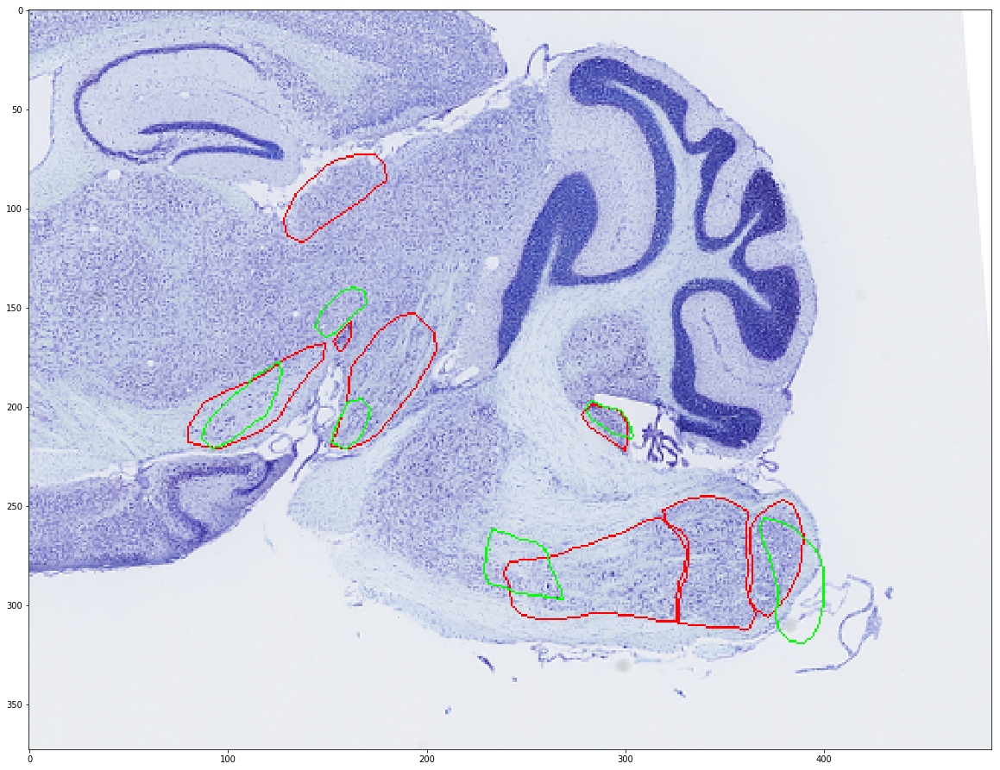

...

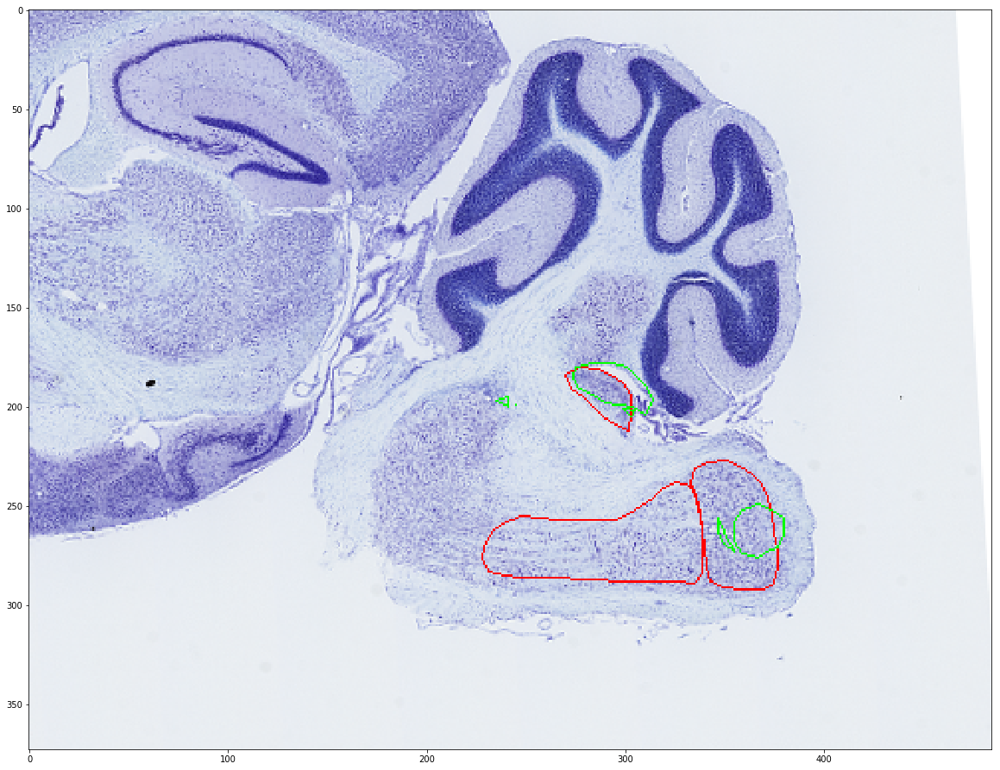

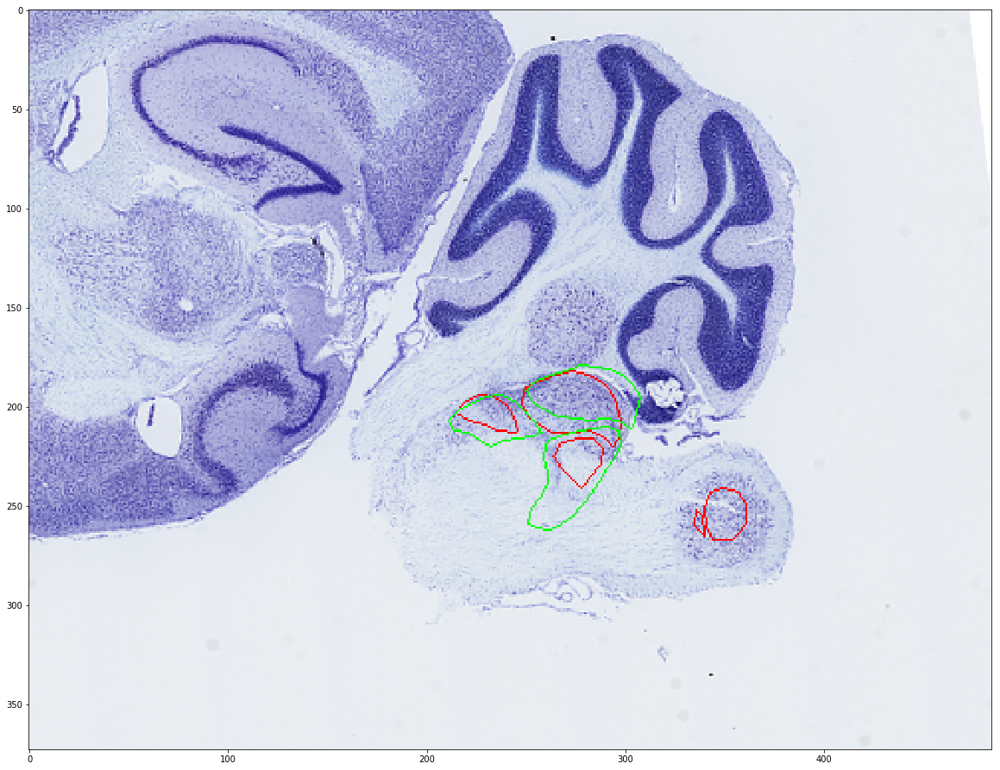

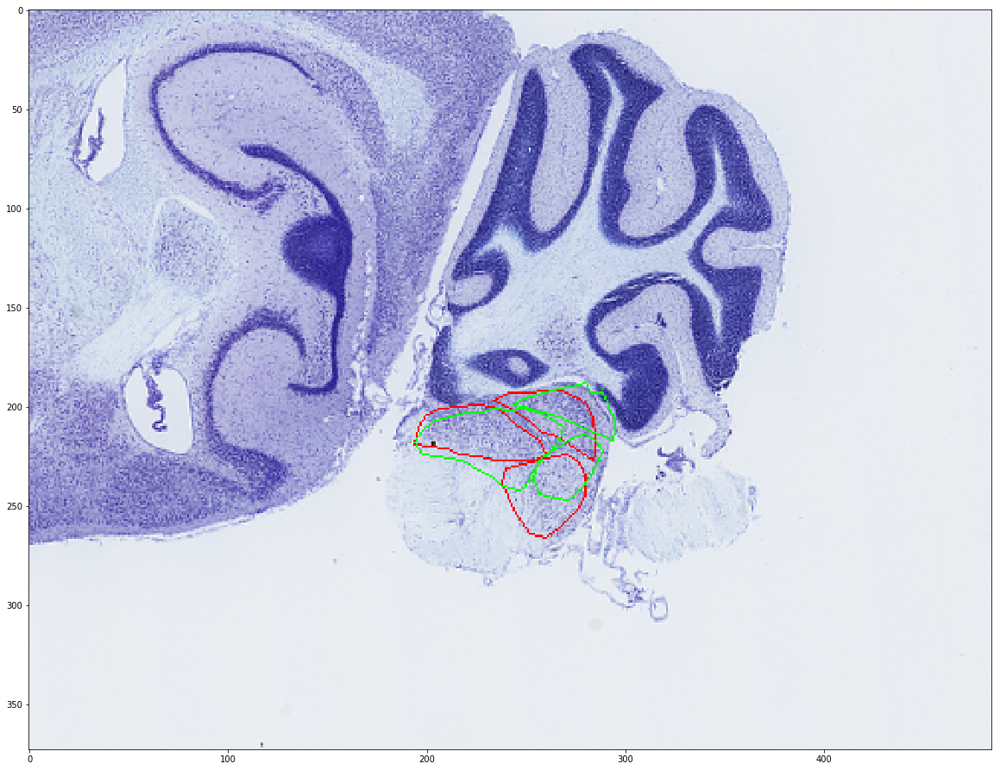

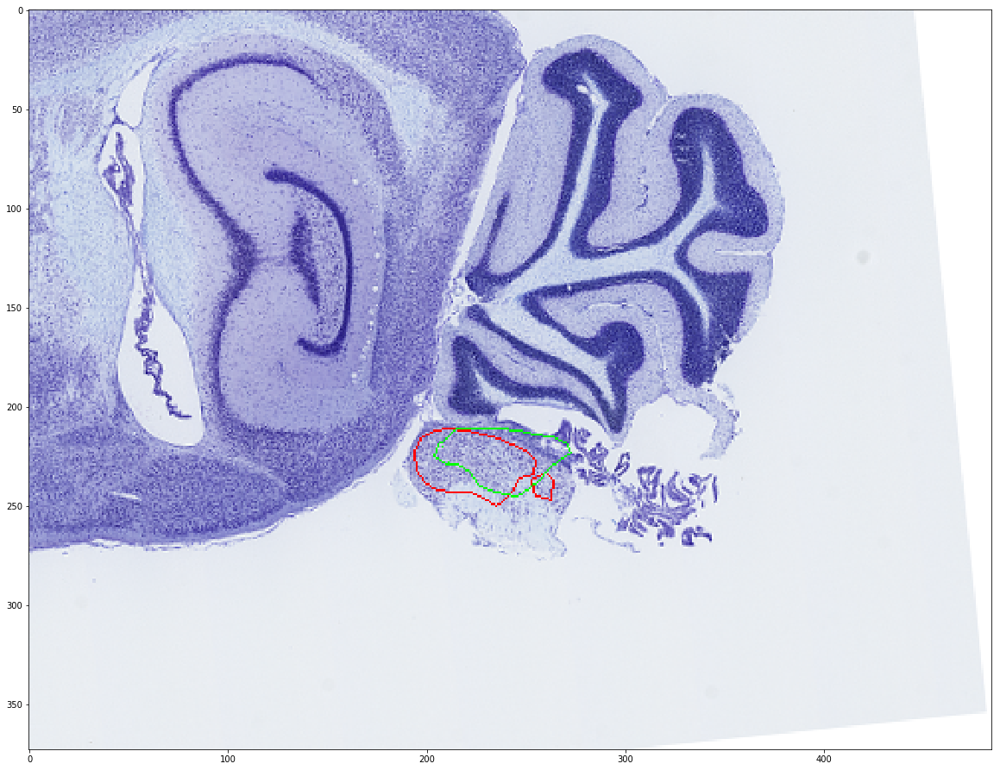

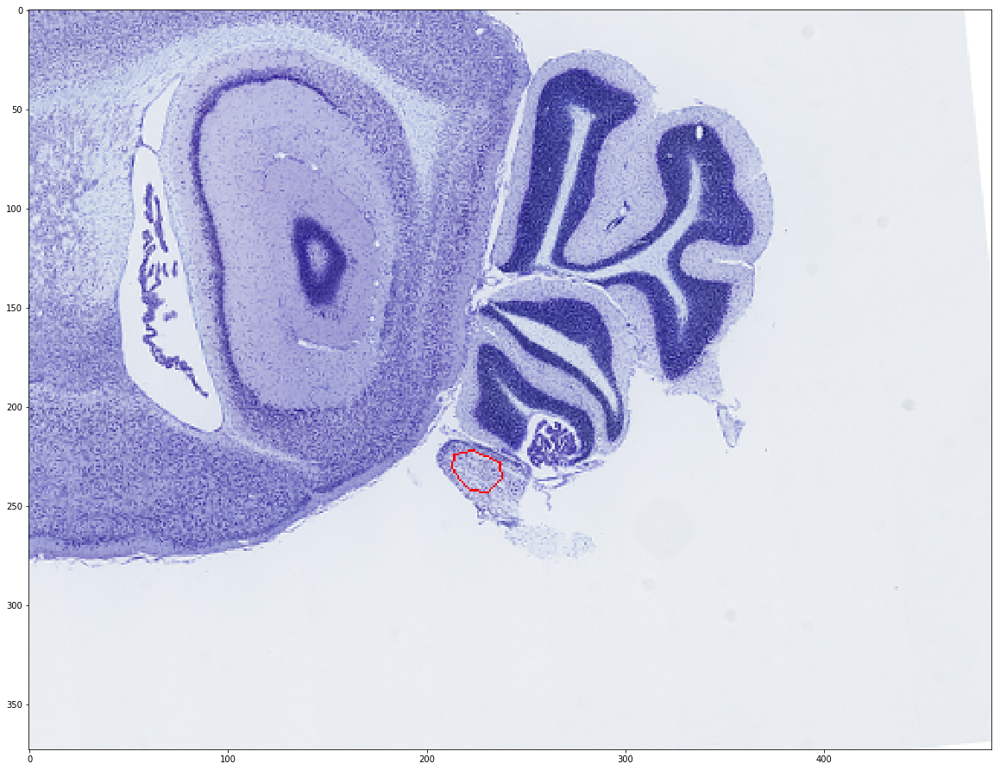

In [72]:
for sec in metadata_cache['valid_sections'][stack_fixed][::10]:
        
    img = DataManager.load_image_v2(stack=stack_fixed, section=sec, resol='thumbnail', prep_id=2)

    viz = img.copy()
    z = np.round(np.mean(DataManager.convert_section_to_z(stack=stack_fixed, sec=sec, downsample=32)))

    contours_f_on_volume = find_contour_points(volume_f_int[..., int(z)])
    contours_f_on_cropped = {i: [cnt + (xmin_vol_f, ymin_vol_f) - (xmin_crop_f, ymin_crop_f) for cnt in cnts] 
                             for i, cnts in contours_f_on_volume.iteritems()}

    for ind_f, cnts_f in contours_f_on_cropped.iteritems():
        for cnt_f in cnts_f:
            cv2.polylines(viz, [cnt_f.astype(np.int)], True, stack_colors[stack_fixed], 1)
    
    contours_m_alignedTo_f_on_volume = find_contour_points(volume_m_aligned_to_f[..., int(z)])
    contours_m_alignedTo_f_on_cropped = {i: [cnt + (xmin_vol_f, ymin_vol_f) - (xmin_crop_f, ymin_crop_f) for cnt in cnts] 
                                         for i, cnts in contours_m_alignedTo_f_on_volume.iteritems()}

    for ind_m, cnts_m in contours_m_alignedTo_f_on_cropped.iteritems():
        for cnt_m in cnts_m:
            cv2.polylines(viz, [cnt_m.astype(np.int)], True, stack_colors[stack_moving], 1)

    plt.figure(figsize=(20,20));
    plt.imshow(viz)
    plt.show();
    
#     viz_fn = os.path.join(viz_dir, '%(stack_moving)s_to_%(stack_fixed)s_%(sec)04d.jpg' % \
#           {'stack_moving': stack_moving, 'stack_fixed': stack_fixed, 'sec': sec})
#     imsave(viz_fn, viz[:800, :1200])

# END

In [24]:
volume_m_alignedTo_f_fn = os.path.join(atlasAlignParams_dir, '%(stack_moving)s_down32_annotationVolume_alignedTo_%(stack_fixed)s_down32_annotationVolume.bp' % \
                                       {'stack_moving': stack_moving, 'stack_fixed': stack_fixed})

In [21]:
from annotation_utilities import fill_sparse_volume
volume_m_aligned_to_f_densified = fill_sparse_volume(volume_m_aligned_to_f)

In [ ]:
# bp.pack_ndarray_file(volume_m_aligned_to_f_densified, volume_m_alignedTo_f_fn)

In [ ]:
# Create voxel occupancy-based probabilistic volume

In [35]:
aggregated_structure_volumes = {}
aggregated_structure_volume_bbox = {}

for label, name_s in label_to_name_fixed.iteritems():
    
    aggregated_volume_aligned_to_f = ((volume_m_aligned_to_f_densified == label).astype(np.int8) + (volume_fixed == label).astype(np.int8)) / 2.
    
    xmin, xmax, ymin, ymax, zmin, zmax = bbox_3d(aggregated_volume_aligned_to_f > 0)
    vol = aggregated_volume_aligned_to_f[ymin:ymax+1, xmin:xmax+1, zmin:zmax+1]
    
    aggregated_structure_volume_bbox[name_s] = (xmin, xmax, ymin, ymax, zmin, zmax)
    aggregated_structure_volumes[name_s] = vol.astype(np.float16).copy()
    
#     output_dir = create_if_not_exists(os.path.join(VOLUME_ROOTDIR, 'atlas_to_%(stack_f)s' % dict(stack_f=stack_fixed)))
#     vol_fn = os.path.join(output_dir, 'atlas_to_%(stack_f)s_%(name_s)s.bp' % dict(stack_f=stack_fixed, name_s=name_s))
#     bbox_fn = os.path.join(output_dir, 'atlas_to_%(stack_f)s_%(name_s)s_bbox.txt' % dict(stack_f=stack_fixed, name_s=name_s))
    
#     bp.pack_ndarray_file(vol, vol_fn)
#     np.savetxt(bbox_fn, np.array((xmin, xmax, ymin, ymax, zmin, zmax))[None])

In [25]:
paired_structures = ['5N', '6N', '7N', '7n', 'Amb', 'LC', 'LRt', 'Pn', 'Tz', 'VLL', 'RMC', 'SNC', 'SNR', '3N', '4N',
                    'Sp5I', 'Sp5O', 'Sp5C', 'PBG', '10N', 'VCA', 'VCP', 'DC']
singular_structures = ['AP', '12N', 'RtTg', 'SC', 'IC']
structures = paired_structures + singular_structures

In [39]:
atlas_score_volumes = {}

for name_u in structures:
# for name_u in ['7N']:
    
    print name_u
    
    if name_u in singular_structures:

        atlas_score_volume = np.zeros_like(volume_fixed, np.float16)
        
        xmin, xmax, ymin, ymax, zmin, zmax = aggregated_structure_volume_bbox[name_u]
        atlas_score_volume[ymin:ymax+1, xmin:xmax+1, zmin:zmax+1] = aggregated_structure_volumes[name_u]
        
        atlas_score_volumes[name_u] = atlas_score_volume.copy()
        
    else:
        
        atlas_score_volume = np.zeros_like(volume_fixed, np.float16)
    
        lname = convert_to_left_name(name_u)

        xmin, xmax, ymin, ymax, zmin, zmax = aggregated_structure_volume_bbox[lname]

        atlas_score_volume[ymin:ymax+1, xmin:xmax+1, zmin:zmax+1] = aggregated_structure_volumes[lname]
        
        atlas_score_volumes[name_u] = atlas_score_volume.copy()
        
        vol_fn = DataManager.get_score_volume_filepath(stack='atlas_on_MD589', label=lname, downscale=32)
        bp.pack_ndarray_file(atlas_score_volume, vol_fn)
        
        ###############################
        
        atlas_score_volume = np.zeros_like(volume_fixed, np.float16)

        rname = convert_to_right_name(name_u)

        xmin, xmax, ymin, ymax, zmin, zmax = aggregated_structure_volume_bbox[rname]
                
        atlas_score_volume[ymin:ymax+1, xmin:xmax+1, zmin:zmax+1] = aggregated_structure_volumes[rname]
        
        atlas_score_volumes[name_u] = atlas_score_volume.copy()
        
        vol_fn = DataManager.get_score_volume_filepath(stack='atlas_on_MD589', label=rname, downscale=32)
        bp.pack_ndarray_file(atlas_score_volume, vol_fn)

5N
6N
7N
7n
Amb
LC
LRt
Pn
Tz
VLL
RMC
SNC
SNR
3N
4N
Sp5I
Sp5O
Sp5C
PBG
10N
VCA
VCP
DC
AP
12N
RtTg
SC
IC


In [79]:
# for name_u, vol in atlas_score_volumes.iteritems():
    
#     output_dir = create_if_not_exists(os.path.join(VOLUME_ROOTDIR, 'atlas_on_%(stack_f)s' % dict(stack_f=stack_fixed), 'score_volumes'))
#     vol_fn = os.path.join(output_dir, 'atlas_on_%(stack_f)s_down32_scoreVolume_%(name)s.bp' % dict(stack_f=stack_fixed, name=name_u))
#     bp.pack_ndarray_file(vol, vol_fn)

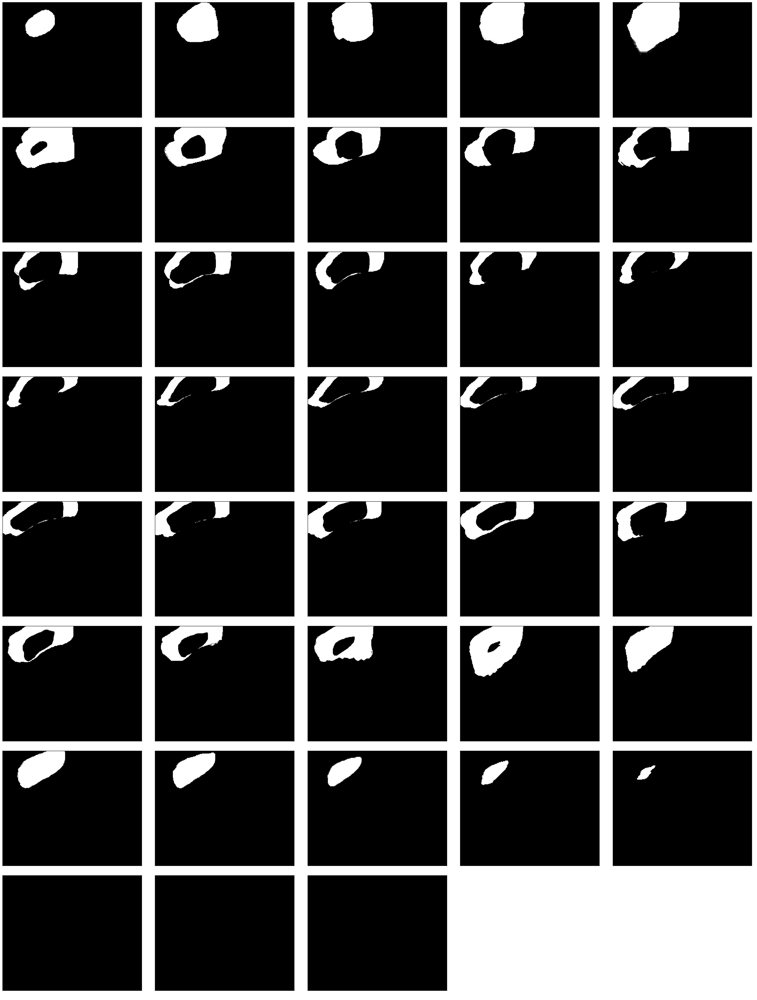

In [8]:
name_u = 'SC_surround'

output_dir = os.path.join(VOLUME_ROOTDIR, 'atlas_on_%(stack_f)s' % dict(stack_f=stack_fixed), 'score_volumes')
vol_fn = os.path.join(output_dir, 'atlas_on_%(stack_f)s_down32_scoreVolume_%(name)s.bp' % dict(stack_f=stack_fixed, name=name_u))

vol = bp.unpack_ndarray_file(vol_fn)

ims = [vol[:, :, z] for z in range(0, vol.shape[2], 10)]

display_images_in_grids(ims, 5, cmap=plt.cm.gray, vmin=0, vmax=1)

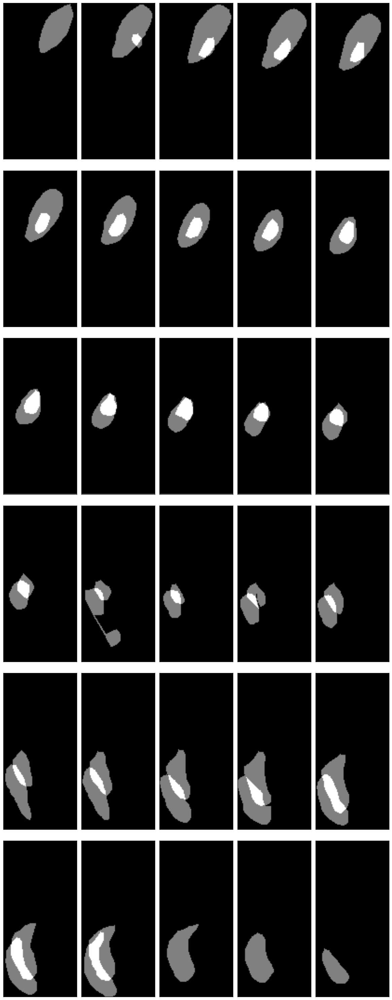

In [56]:
name_s = 'VLL_L'
ims = [aggregated_structure_volumes[name_s][:, :, z] 
       for z in range(0, aggregated_structure_volumes[name_s].shape[2], 2)]

display_images_in_grids(ims, 5, cmap=plt.cm.gray, vmin=0, vmax=1)

In [111]:
# Generate volumes for landmark surround regions

In [8]:
import scipy.ndimage as nd
from skimage.morphology import label

In [9]:
enlarge_factor = 1.5

In [26]:
structures_sided = sum([[n] if n in singular_structures 
                        else [convert_to_left_name(n), convert_to_right_name(n)] 
                        for n in structures], [])

In [48]:
stack_fixed = 'MD589'

output_dir = os.path.join(VOLUME_ROOTDIR, 'atlas_on_%(stack_f)s' % dict(stack_f=stack_fixed), 'score_volumes')

for name_s in structures_sided:
# for name_s in ['AP']:
    
    print name_s

    vol_fn = os.path.join(output_dir, 'atlas_on_%(stack_f)s_down32_scoreVolume_%(name)s.bp' % dict(stack_f=stack_fixed, name=name_s))
    vol = bp.unpack_ndarray_file(vol_fn)

    labeled_volume, num_components = label(vol > 0, return_num=True)
    
    overall_volume = np.zeros(vol.shape, np.float16)
    overall_ydim, overall_xdim, overall_zdim = overall_volume.shape

    for l in range(1, 1+num_components):

        ys, xs, zs = np.where(labeled_volume == l)

        centroid_y = ys.mean().astype(np.int)
        centroid_x = xs.mean().astype(np.int)
        centroid_z = zs.mean().astype(np.int)

        xmin, xmax, ymin, ymax, zmin, zmax = bbox_3d(labeled_volume == l)

        cropped_vol = labeled_volume[ymin:ymax+1, xmin:xmax+1, zmin:zmax+1] == l
        cropped_vol_ydim, cropped_vol_xdim, cropped_vol_zdim = cropped_vol.shape

        enlarged_vol = nd.interpolation.zoom(cropped_vol.astype(np.float), zoom=enlarge_factor) > .1
        enlarged_ydim, enlarged_xdim, enlarged_zdim = enlarged_vol.shape

        center_y, center_x, center_z = np.array(enlarged_vol.shape)/2

        enlarged_vol[center_y-cropped_vol_ydim/2:center_y+cropped_vol_ydim-cropped_vol_ydim/2,
                     center_x-cropped_vol_xdim/2:center_x+cropped_vol_xdim-cropped_vol_xdim/2,
                     center_z-cropped_vol_zdim/2:center_z+cropped_vol_zdim-cropped_vol_zdim/2][cropped_vol] = 0
        
        proposed_sub_xmin = centroid_x - enlarged_xdim/2
        proposed_sub_xmax = proposed_sub_xmin + enlarged_xdim - 1
        
        proposed_sub_zmin = centroid_z - enlarged_zdim/2
        proposed_sub_zmax = proposed_sub_zmin + enlarged_zdim - 1
        
        proposed_sub_ymin = centroid_y - enlarged_ydim/2
        proposed_sub_ymax = proposed_sub_ymin + enlarged_ydim - 1
        
        if proposed_sub_ymin < 0:
            sub_vol_ymin = - proposed_sub_ymin
            sub_vol_ymax = enlarged_ydim - 1
            proposed_sub_ymin = 0
        elif proposed_sub_ymax >= overall_ydim:
            sub_vol_ymin = 0
            sub_vol_ymax = enlarged_ydim - 1 - (proposed_sub_ymax - overall_ydim + 1)
            proposed_sub_ymax = overall_ydim - 1
        else:
            sub_vol_ymin = 0
            sub_vol_ymax = enlarged_ydim - 1

        if proposed_sub_xmin < 0:
            sub_vol_xmin = - proposed_sub_xmin
            sub_vol_xmax = enlarged_xdim - 1
            proposed_sub_xmin = 0
        elif proposed_sub_xmax >= overall_xdim:
            sub_vol_xmin = 0
            sub_vol_xmax = enlarged_xdim - 1 - (proposed_sub_xmax - overall_xdim + 1)
            proposed_sub_xmax = overall_xdim - 1
        else:
            sub_vol_xmin = 0
            sub_vol_xmax = enlarged_xdim - 1

        if proposed_sub_zmin < 0:
            sub_vol_zmin = - proposed_sub_zmin
            sub_vol_zmax = enlarged_zdim - 1
            proposed_sub_zmin = 0
        elif proposed_sub_zmax >= overall_zdim:
            sub_vol_zmin = 0
            sub_vol_zmax = enlarged_zdim - 1 - (proposed_sub_zmax - overall_zdim + 1)
            proposed_sub_zmax = overall_zdim - 1
        else:
            sub_vol_zmin = 0
            sub_vol_zmax = enlarged_zdim - 1

        overall_volume[proposed_sub_ymin:proposed_sub_ymax+1,
                       proposed_sub_xmin:proposed_sub_xmax+1,
                       proposed_sub_zmin:proposed_sub_zmax+1] = \
        enlarged_vol[sub_vol_ymin:sub_vol_ymax+1,
                    sub_vol_xmin:sub_vol_xmax+1,
                    sub_vol_zmin:sub_vol_zmax+1].copy().astype(np.float16)

    vol_fn = DataManager.get_score_volume_filepath(stack='atlas_on_MD589', label=name_s + '_surround', downscale=32)
    bp.pack_ndarray_file(overall_volume, vol_fn)

5N_L
5N_R
6N_L
6N_R
7N_L
7N_R
7n_L
7n_R
Amb_L
Amb_R
LC_L
LC_R
LRt_L
LRt_R
Pn_L
Pn_R
Tz_L
Tz_R
VLL_L
VLL_R
RMC_L
RMC_R
SNC_L
SNC_R
SNR_L
SNR_R
3N_L
3N_R
4N_L
4N_R
Sp5I_L
Sp5I_R
Sp5O_L
Sp5O_R
Sp5C_L
Sp5C_R
PBG_L
PBG_R
10N_L
10N_R
VCA_L
VCA_R
VCP_L
VCP_R
DC_L
DC_R
AP
12N
RtTg
SC
IC


In [49]:
# stack_fixed = 'MD589'

# output_dir = os.path.join(VOLUME_ROOTDIR, 'atlas_on_%(stack_f)s' % dict(stack_f=stack_fixed), 'score_volumes')

# for name_u in structures:
# # for name_u in ['LRt']:
    
#     print name_u

#     vol_fn = os.path.join(output_dir, 'atlas_on_%(stack_f)s_down32_scoreVolume_%(name)s.bp' % dict(stack_f=stack_fixed, name=name_u))
#     vol = bp.unpack_ndarray_file(vol_fn)

#     labeled_volume, num_components = label(vol > 0, return_num=True)
    
#     overall_volume = np.zeros(vol.shape, np.float16)
#     overall_ydim, overall_xdim, overall_zdim = overall_volume.shape

#     for l in range(1, 1+num_components):

#         ys, xs, zs = np.where(labeled_volume == l)

#         centroid_y = ys.mean().astype(np.int)
#         centroid_x = xs.mean().astype(np.int)
#         centroid_z = zs.mean().astype(np.int)

#         xmin, xmax, ymin, ymax, zmin, zmax = bbox_3d(labeled_volume == l)

#         cropped_vol = labeled_volume[ymin:ymax+1, xmin:xmax+1, zmin:zmax+1] == l
#         cropped_vol_ydim, cropped_vol_xdim, cropped_vol_zdim = cropped_vol.shape

#         enlarged_vol = nd.interpolation.zoom(cropped_vol.astype(np.float), zoom=enlarge_factor) > .1
#         enlarged_ydim, enlarged_xdim, enlarged_zdim = enlarged_vol.shape

#         center_y, center_x, center_z = np.array(enlarged_vol.shape)/2

#         enlarged_vol[center_y-cropped_vol_ydim/2:center_y+cropped_vol_ydim-cropped_vol_ydim/2,
#                      center_x-cropped_vol_xdim/2:center_x+cropped_vol_xdim-cropped_vol_xdim/2,
#                      center_z-cropped_vol_zdim/2:center_z+cropped_vol_zdim-cropped_vol_zdim/2][cropped_vol] = 0
        
#         proposed_sub_xmin = centroid_x - enlarged_xdim/2
#         proposed_sub_xmax = proposed_sub_xmin + enlarged_xdim - 1
        
#         proposed_sub_zmin = centroid_z - enlarged_zdim/2
#         proposed_sub_zmax = proposed_sub_zmin + enlarged_zdim - 1
        
#         proposed_sub_ymin = centroid_y - enlarged_ydim/2
#         proposed_sub_ymax = proposed_sub_ymin + enlarged_ydim - 1
        
#         if proposed_sub_ymin < 0:
#             sub_vol_ymin = - proposed_sub_ymin
#             sub_vol_ymax = enlarged_ydim - 1
#             proposed_sub_ymin = 0
#         elif proposed_sub_ymax >= overall_ydim:
#             sub_vol_ymin = 0
#             sub_vol_ymax = enlarged_ydim - 1 - (proposed_sub_ymax - overall_ydim + 1)
#             proposed_sub_ymax = overall_ydim - 1
#         else:
#             sub_vol_ymin = 0
#             sub_vol_ymax = enlarged_ydim - 1

#         if proposed_sub_xmin < 0:
#             sub_vol_xmin = - proposed_sub_xmin
#             sub_vol_xmax = enlarged_xdim - 1
#             proposed_sub_xmin = 0
#         elif proposed_sub_xmax >= overall_xdim:
#             sub_vol_xmin = 0
#             sub_vol_xmax = enlarged_xdim - 1 - (proposed_sub_xmax - overall_xdim + 1)
#             proposed_sub_xmax = overall_xdim - 1
#         else:
#             sub_vol_xmin = 0
#             sub_vol_xmax = enlarged_xdim - 1

#         if proposed_sub_zmin < 0:
#             sub_vol_zmin = - proposed_sub_zmin
#             sub_vol_zmax = enlarged_zdim - 1
#             proposed_sub_zmin = 0
#         elif proposed_sub_zmax >= overall_zdim:
#             sub_vol_zmin = 0
#             sub_vol_zmax = enlarged_zdim - 1 - (proposed_sub_zmax - overall_zdim + 1)
#             proposed_sub_zmax = overall_zdim - 1
#         else:
#             sub_vol_zmin = 0
#             sub_vol_zmax = enlarged_zdim - 1

#         overall_volume[proposed_sub_ymin:proposed_sub_ymax+1,
#                        proposed_sub_xmin:proposed_sub_xmax+1,
#                        proposed_sub_zmin:proposed_sub_zmax+1] = \
#         enlarged_vol[sub_vol_ymin:sub_vol_ymax+1,
#                     sub_vol_xmin:sub_vol_xmax+1,
#                     sub_vol_zmin:sub_vol_zmax+1].copy().astype(np.float16)

# #     vol_fn = os.path.join(output_dir, 'atlas_on_%(stack_f)s_down32_scoreVolume_%(name)s_surround.bp' % dict(stack_f=stack_fixed, name=name_u))
# #     bp.pack_ndarray_file(overall_volume, vol_fn)

In [52]:
vol = DataManager.load_score_volume(stack='atlas_on_MD589', label='VLL_R_surround', downscale=32)

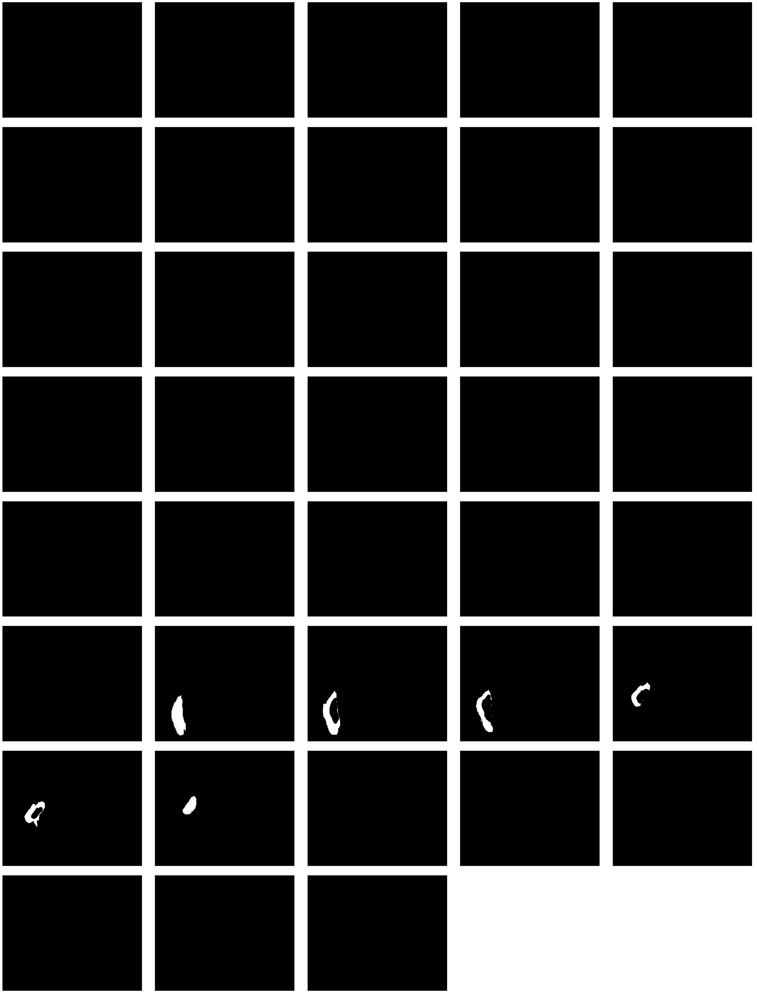

In [53]:
ims = [vol[:, :, z] for z in range(0, vol.shape[2], 10)]
display_images_in_grids(ims, 5, cmap=plt.cm.gray, vmin=0, vmax=1)

In [ ]:
ims = [overall_volume[:, :, z] for z in range(0, overall_volume.shape[2], 2)]
display_images_in_grids(ims, 5, cmap=plt.cm.gray, vmin=0, vmax=1)